# Reproduce tweakreg's catalog making

June 24, 2023: tweakreg is producing bad frame matching for F405N and F466N.  I want to figure out why, so I'm checking what tweakreg does.

Rough conclusion: the "deep" catalog is too deep.  >5000 sources is too many, tweakreg maybe justifiably gets confused.

In [1]:
from jwst.tweakreg.tweakreg_catalog import make_tweakreg_catalog
from jwst.datamodels import ModelContainer
import os

In [2]:
basepath = '/orange/adamginsburg/jwst/brick'

In [3]:
os.chdir(basepath)

In [4]:
asn_filename = 'F405N/pipeline/jw02221-o001_20221007t121022_image3_001_nrca_asn.json'
images = ModelContainer(asn_filename)
im0 = images[0]
im0

<ImageModel(2048, 2048) from jw02221001001_03101_00021_nrcalong_destreak.fits>

In [5]:
kernel_fwhm = 2.5 # default; is this overridden anywhere?
kernel_fwhm = 1.91 # set in the tweakreg params, maybe from the json file?
cat = make_tweakreg_catalog(im0, kernel_fwhm, snr_threshold=15, brightest=5000, )
len(cat)

2023-06-26 09:05:56,642 - stpipe - WARNING - /blue/adamginsburg/adamginsburg/repos/photutils/photutils/background/background_2d.py:273: AstropyUserWarning: Input data contains invalid values (NaNs or infs), which were automatically masked.
  warnings.warn('Input data contains invalid values (NaNs or '

2023-06-26 09:05:58,066 - stpipe - INFO - In make_tweakreg_catalog, brightest = 5000
2023-06-26 09:05:58,945 - stpipe - INFO - In make_tweakreg_catalog, brightest = 5000.  len(sources) = 5000


5000

In [6]:
%matplotlib inline
import pylab as pl
import numpy as np
from astropy.visualization import simple_norm

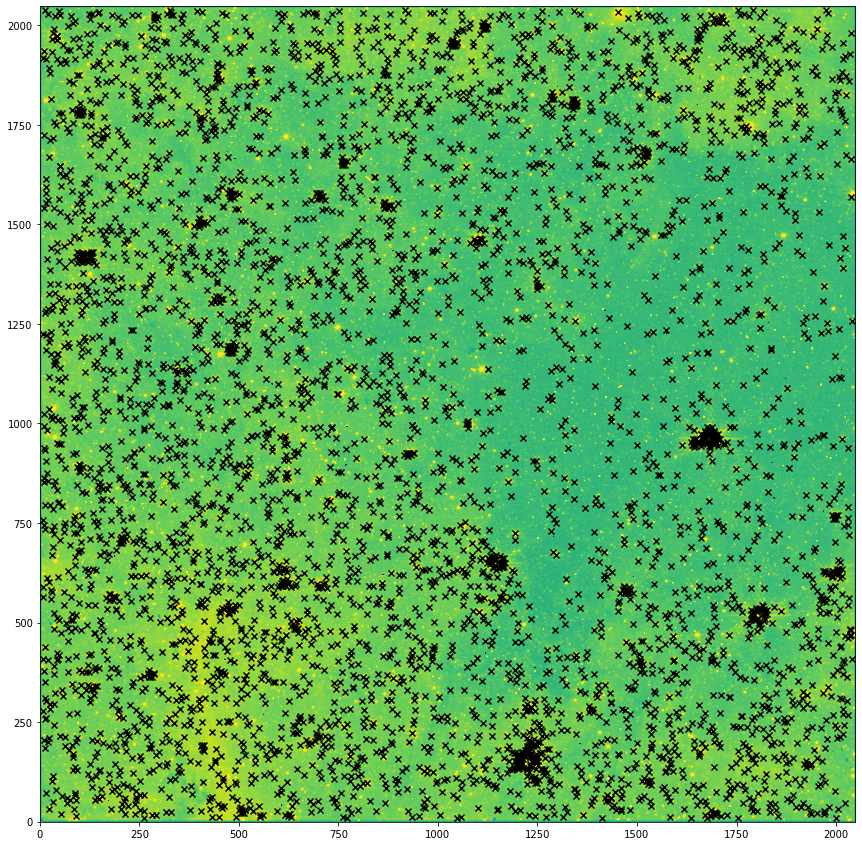

In [7]:
pl.figure(figsize=(15,15))
pl.imshow(np.nan_to_num(im0.data), norm=simple_norm(im0.data, stretch='log', min_cut=-10, max_cut=150), origin='lower')
pl.scatter(cat['xcentroid'], cat['ycentroid'], marker='x', color='k')

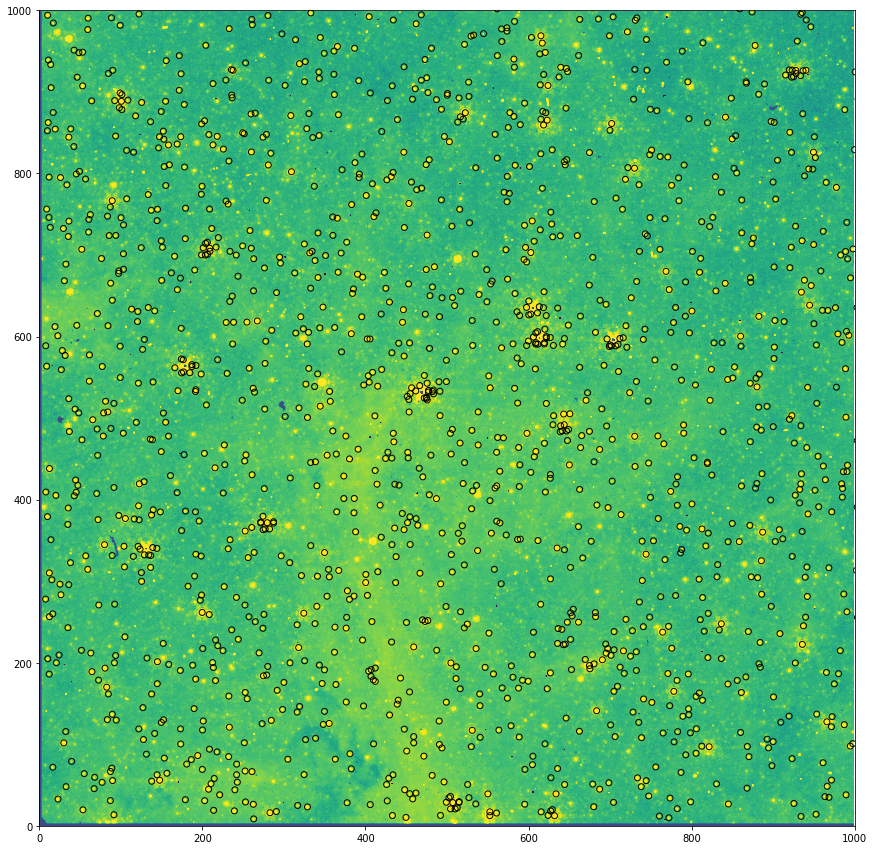

In [8]:
pl.figure(figsize=(15,15))
pl.imshow(np.nan_to_num(im0.data)[:1000, :1000], norm=simple_norm(im0.data, stretch='log', min_cut=-1, max_cut=250), origin='lower')
pl.scatter(cat['xcentroid'], cat['ycentroid'], marker='o', edgecolor='k', facecolor='none')
pl.axis([0,1000,0,1000]);

In [9]:
ww = im0.get_fits_wcs()

2023-06-26 09:06:01,296 - stpipe - WARNING - /blue/adamginsburg/adamginsburg/repos/astropy/astropy/wcs/wcs.py:819: FITSFixedWarning: 'datfix' made the change 'Set DATE-BEG to '2022-08-28T01:19:50.777' from MJD-BEG.
Set DATE-AVG to '2022-08-28T01:20:17.619' from MJD-AVG.
Set DATE-END to '2022-08-28T01:20:44.461' from MJD-END'.
  warnings.warn(

2023-06-26 09:06:01,297 - stpipe - WARNING - /blue/adamginsburg/adamginsburg/repos/astropy/astropy/wcs/wcs.py:819: FITSFixedWarning: 'obsfix' made the change 'Set OBSGEO-L to   -51.568611 from OBSGEO-[XYZ].
Set OBSGEO-B to   -20.701309 from OBSGEO-[XYZ].
Set OBSGEO-H to 1526880827.485 from OBSGEO-[XYZ]'.
  warnings.warn(



In [10]:
from astropy.table import Table
abs_refcat = f'{basepath}/catalogs/crowdsource_based_nircam-long_reference_astrometric_catalog.ecsv'
reftbl = Table.read(abs_refcat)

In [11]:
reftbl[:10]

skycoord_f410m,skycoord_f405n,mag_ab_f410m,RA,DEC
"deg,deg","deg,deg",,deg,deg
SkyCoord,SkyCoord,float32,float64,float64
"266.5138001154151,-28.747930796496217","266.5137997611741,-28.747927048431137",12.388214,266.5138001154151,-28.747930796496217
"266.5582577596566,-28.704823443321967","266.5582430459691,-28.704822293787576",12.531346,266.5582577596566,-28.704823443321967
"266.5128798072241,-28.674406454181245","266.51287114206366,-28.674408722494523",12.766528,266.5128798072241,-28.674406454181245
"266.55389473444313,-28.761192294410005","266.5538724844962,-28.761182633766616",13.067997,266.55389473444313,-28.761192294410005
"266.51369287288344,-28.75392448294003","266.51369360901055,-28.753912533974617",13.396491,266.51369287288344,-28.75392448294003
"266.55749937277,-28.729002783774522","266.5574884951591,-28.729001979473733",13.399994,266.55749937277,-28.729002783774522
"266.55748331388304,-28.722626515933367","266.5574714088633,-28.722644625058827",13.506872,266.55748331388304,-28.722626515933367
"266.55772145280406,-28.723968933204713","266.55771006738235,-28.72397151981827",13.5434475,266.55772145280406,-28.723968933204713


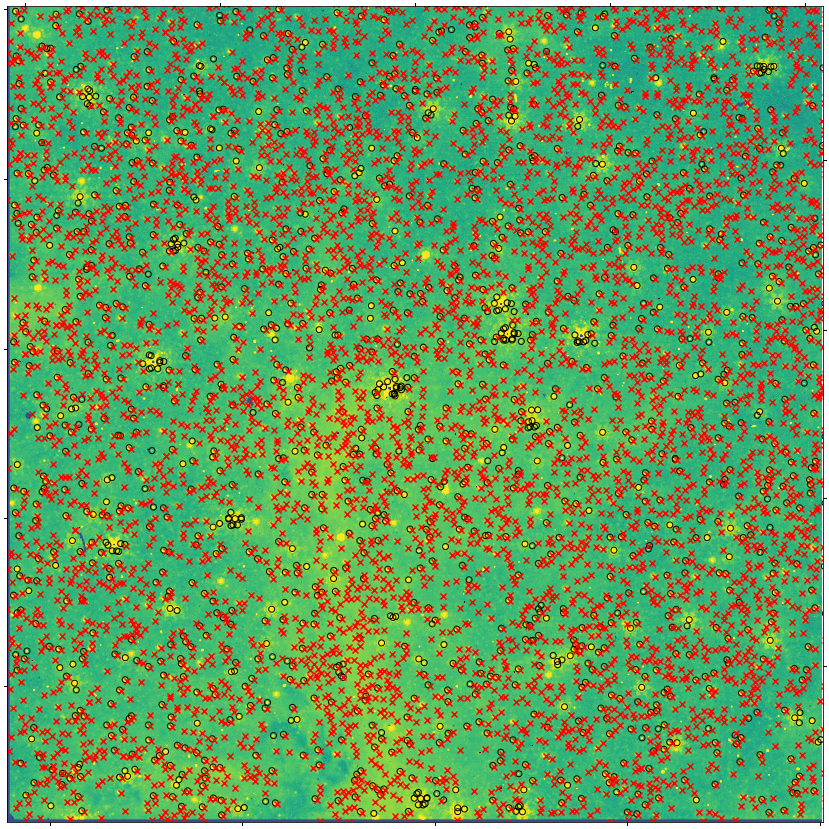

In [12]:
pl.figure(figsize=(15,15))
ax = pl.subplot(projection=ww)
ax.imshow(np.nan_to_num(im0.data)[:1000, :1000], norm=simple_norm(im0.data, stretch='log', min_cut=-1, max_cut=250), origin='lower')
ax.scatter(cat['xcentroid'], cat['ycentroid'], marker='o', edgecolor='k', facecolor='none')
ax.scatter_coord(reftbl['skycoord_f405n'], marker='x', color='r')
ax.axis([0,1000,0,1000]);

## This is the checkpoint

I'm looking for x's to land close to circles.

It looks like they're super close, so abs_searchrad can be even smaller... 0.2 instead of 0.5

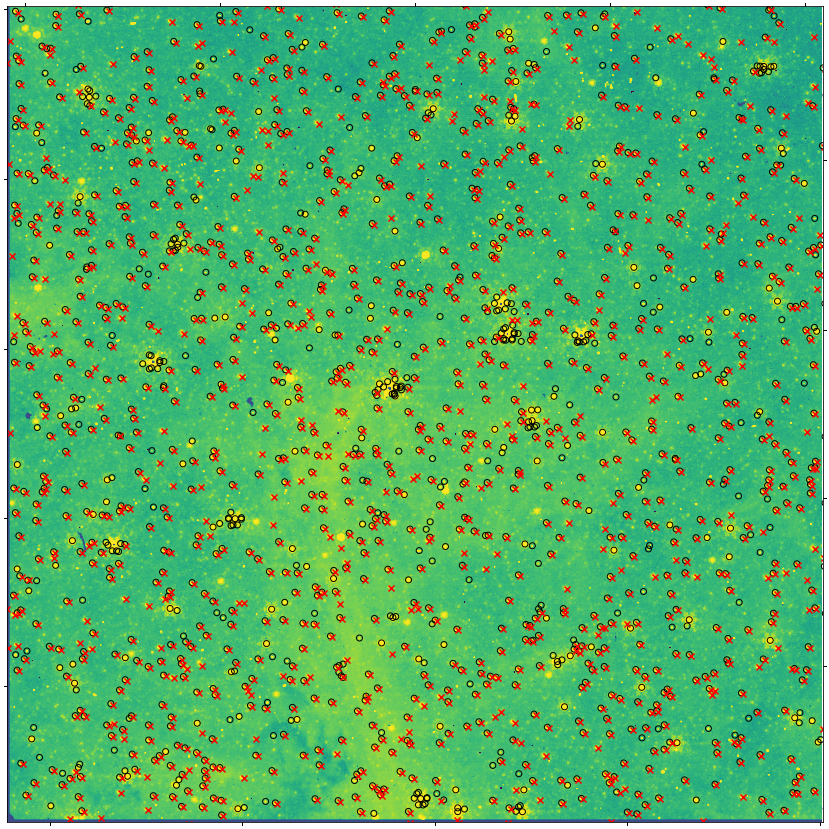

In [13]:
pl.figure(figsize=(15,15))
ax = pl.subplot(projection=ww)
ax.imshow(np.nan_to_num(im0.data)[:1000, :1000], norm=simple_norm(im0.data, stretch='log', min_cut=-1, max_cut=250), origin='lower')
ax.scatter(cat['xcentroid'], cat['ycentroid'], marker='o', edgecolor='k', facecolor='none')
ax.scatter_coord(reftbl['skycoord_f405n'][:10000], marker='x', color='r')
ax.axis([0,1000,0,1000]);

# Tweakreg writes out .ecsv catalogs

Do they pick out fake sources, perhaps?

In [14]:
catname = im0.meta.filename.replace(".fits", "_cat.ecsv")
cat_from_destreak = Table.read(f'{basepath}/F405N/pipeline/{catname}')
len(cat_from_destreak)

500

In [15]:
cat_from_destreak[:10]

id,x,y,flux
int64,float64,float64,float64
1,478.4324916753027,1185.8339505560864,99.3243637084961
2,404.80509162027204,1506.2832518497842,96.79386138916016
3,288.78466426041945,2021.0163910954313,96.35198974609375
4,1342.6435487301667,1806.1195666544688,94.21537017822266
5,1643.3831674250355,953.8401384059557,89.59688568115234
6,482.1119179953347,1578.4531352291865,89.30939483642578
7,1777.7549236504644,1740.289314152079,86.24234008789062
8,208.9365506430901,708.3383915685613,85.69071960449219
9,507.09159407971566,28.478860465137977,85.29691314697266


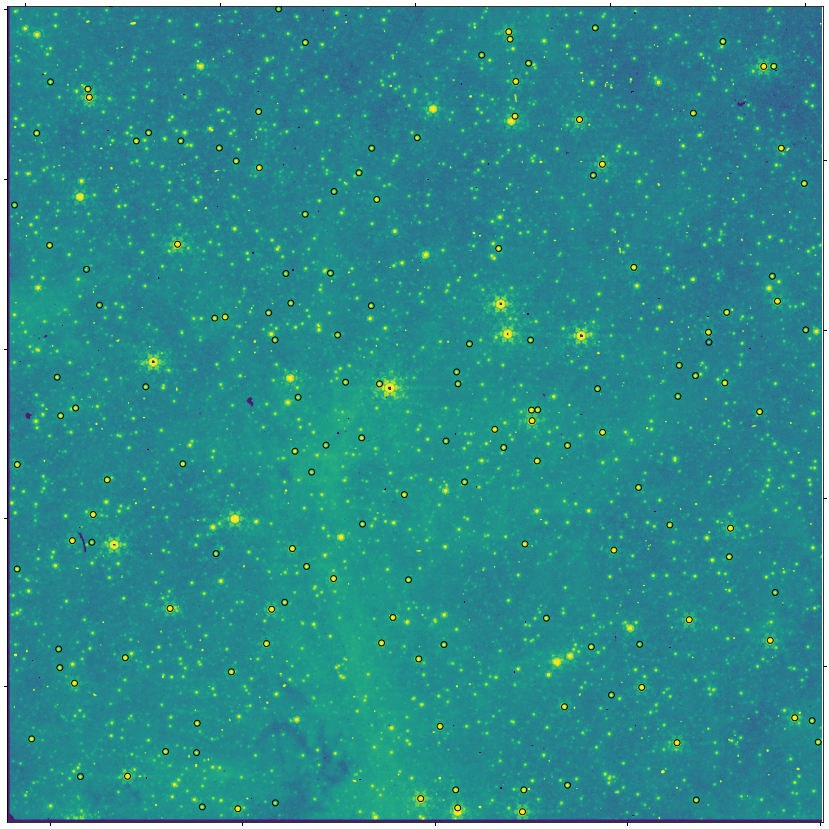

In [16]:
pl.figure(figsize=(15,15))
ax = pl.subplot(projection=ww)
ax.imshow(np.nan_to_num(im0.data)[:1000, :1000], norm=simple_norm(im0.data, stretch='log', min_cut=-1, max_cut=1250), origin='lower')
ax.scatter(cat_from_destreak['x'], cat_from_destreak['y'], marker='o', edgecolor='k', facecolor='none')
ax.axis([0,1000,0,1000]);

# Can we avoid the PSF artifacts?

In [17]:
kernel_fwhm = 1.91 
cat2bad = make_tweakreg_catalog(im0, kernel_fwhm, snr_threshold=30, brightest=5000,)
len(cat2bad)

2023-06-26 09:06:08,461 - stpipe - WARNING - /blue/adamginsburg/adamginsburg/repos/photutils/photutils/background/background_2d.py:273: AstropyUserWarning: Input data contains invalid values (NaNs or infs), which were automatically masked.
  warnings.warn('Input data contains invalid values (NaNs or '

2023-06-26 09:06:09,940 - stpipe - INFO - In make_tweakreg_catalog, brightest = 5000
2023-06-26 09:06:10,463 - stpipe - INFO - In make_tweakreg_catalog, brightest = 5000.  len(sources) = 3558


3558

In [18]:
kernel_fwhm = 2.5 # default; is this overridden anywhere?
kernel_fwhm = 1.91 # set in the tweakreg params, maybe from the json file?
cat2 = make_tweakreg_catalog(im0, kernel_fwhm, snr_threshold=30, brightest=5000, roundlo=-0.25, roundhi=0.25,
                            sharplo=0.3, sharphi=0.9)
len(cat2)

2023-06-26 09:06:10,511 - stpipe - WARNING - /blue/adamginsburg/adamginsburg/repos/photutils/photutils/background/background_2d.py:273: AstropyUserWarning: Input data contains invalid values (NaNs or infs), which were automatically masked.
  warnings.warn('Input data contains invalid values (NaNs or '

2023-06-26 09:06:11,938 - stpipe - INFO - In make_tweakreg_catalog, brightest = 5000
2023-06-26 09:06:12,464 - stpipe - INFO - In make_tweakreg_catalog, brightest = 5000.  len(sources) = 2206


2206

### Black circles: kept with new config.  Red dots: an older config

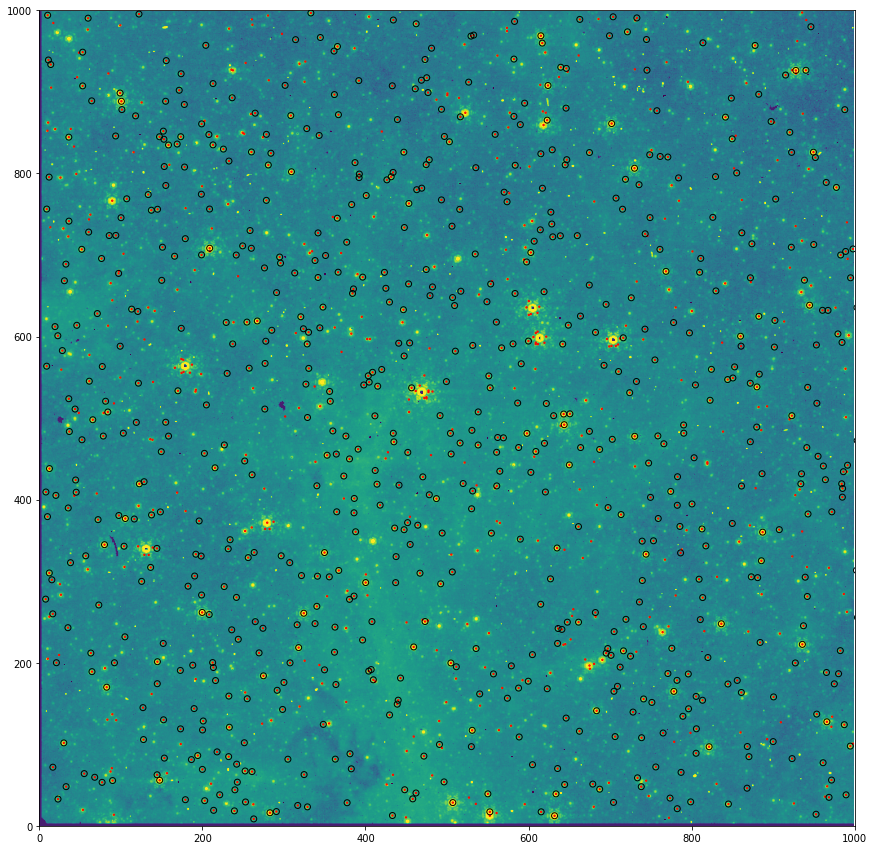

In [19]:
pl.figure(figsize=(15,15))
pl.imshow(np.nan_to_num(im0.data)[:1000, :1000], norm=simple_norm(im0.data, stretch='log', min_cut=-1, max_cut=1250), origin='lower')
pl.scatter(cat2bad['xcentroid'], cat2bad['ycentroid'], marker='o', edgecolor='r', facecolor='none', s=2)
pl.scatter(cat2['xcentroid'], cat2['ycentroid'], marker='o', edgecolor='k', facecolor='none')
pl.axis([0,1000,0,1000]);

# Why did F410M "work"?

In [20]:
asn_filename_410 = 'F410M/pipeline/jw02221-o001_20220828t044842_image3_001_nrca_asn.json'
images_410 = ModelContainer(asn_filename_410)
im0_410 = images_410[0]
im0_410

<ImageModel(2048, 2048) from jw02221001001_07101_00005_nrcalong_cal.fits>

In [21]:
kernel_fwhm_410 = 2.304 # default; is this overridden anywhere?
kernel_fwhm_410 = 2.0 #1.91 # set in the tweakreg params, maybe from the json file?
kernel_fwhm_410 = 2.179 # from fwhm_table.ecsv
cat_410 = make_tweakreg_catalog(im0_410, kernel_fwhm_410, snr_threshold=15, brightest=5000, )
len(cat_410)

2023-06-26 09:06:26,397 - stpipe - WARNING - /blue/adamginsburg/adamginsburg/repos/photutils/photutils/background/background_2d.py:273: AstropyUserWarning: Input data contains invalid values (NaNs or infs), which were automatically masked.
  warnings.warn('Input data contains invalid values (NaNs or '

2023-06-26 09:06:26,633 - stpipe - WARNING - /blue/adamginsburg/adamginsburg/repos/photutils/photutils/background/background_2d.py:273: AstropyUserWarning: Input data contains invalid values (NaNs or infs), which were automatically masked.
  warnings.warn('Input data contains invalid values (NaNs or '

2023-06-26 09:06:26,836 - stpipe - INFO - Background could not be estimated in meshes. Using the entire unmasked array for background estimation: bkg_boxsize=(2048, 2048).
2023-06-26 09:06:26,968 - stpipe - INFO - In make_tweakreg_catalog, brightest = 5000
2023-06-26 09:06:27,484 - stpipe - INFO - In make_tweakreg_catalog, brightest = 5000.  len(sources) = 4104


4104

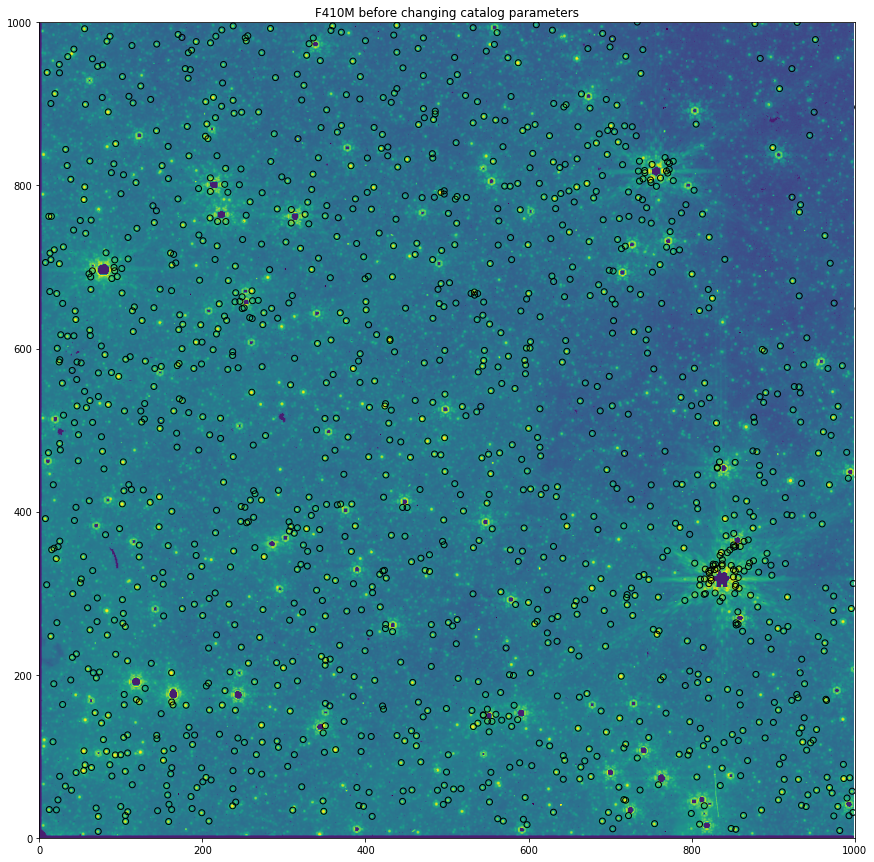

In [22]:
pl.figure(figsize=(15,15))
pl.imshow(np.nan_to_num(im0_410.data)[:1000, :1000], norm=simple_norm(im0_410.data, stretch='log', min_cut=-1, max_cut=1250), origin='lower')
pl.scatter(cat_410['xcentroid'], cat_410['ycentroid'], marker='o', edgecolor='k', facecolor='none')
pl.title("F410M before changing catalog parameters")
pl.axis([0,1000,0,1000]);

In [23]:
kernel_fwhm_410 = 2.304 # default; is this overridden anywhere?
kernel_fwhm_410 = 2.0 #1.91 # set in the tweakreg params, maybe from the json file?
kernel_fwhm_410 = 2.179 # from fwhm_table.ecsv
cat_410 = make_tweakreg_catalog(im0_410, kernel_fwhm_410, snr_threshold=15, brightest=5000, roundlo=-0.25, roundhi=0.25,
                            sharplo=0.3, sharphi=0.9)
len(cat_410)

2023-06-26 09:06:28,625 - stpipe - WARNING - /blue/adamginsburg/adamginsburg/repos/photutils/photutils/background/background_2d.py:273: AstropyUserWarning: Input data contains invalid values (NaNs or infs), which were automatically masked.
  warnings.warn('Input data contains invalid values (NaNs or '

2023-06-26 09:06:28,858 - stpipe - WARNING - /blue/adamginsburg/adamginsburg/repos/photutils/photutils/background/background_2d.py:273: AstropyUserWarning: Input data contains invalid values (NaNs or infs), which were automatically masked.
  warnings.warn('Input data contains invalid values (NaNs or '

2023-06-26 09:06:29,061 - stpipe - INFO - Background could not be estimated in meshes. Using the entire unmasked array for background estimation: bkg_boxsize=(2048, 2048).
2023-06-26 09:06:29,192 - stpipe - INFO - In make_tweakreg_catalog, brightest = 5000
2023-06-26 09:06:29,700 - stpipe - INFO - In make_tweakreg_catalog, brightest = 5000.  len(sources) = 2763


2763

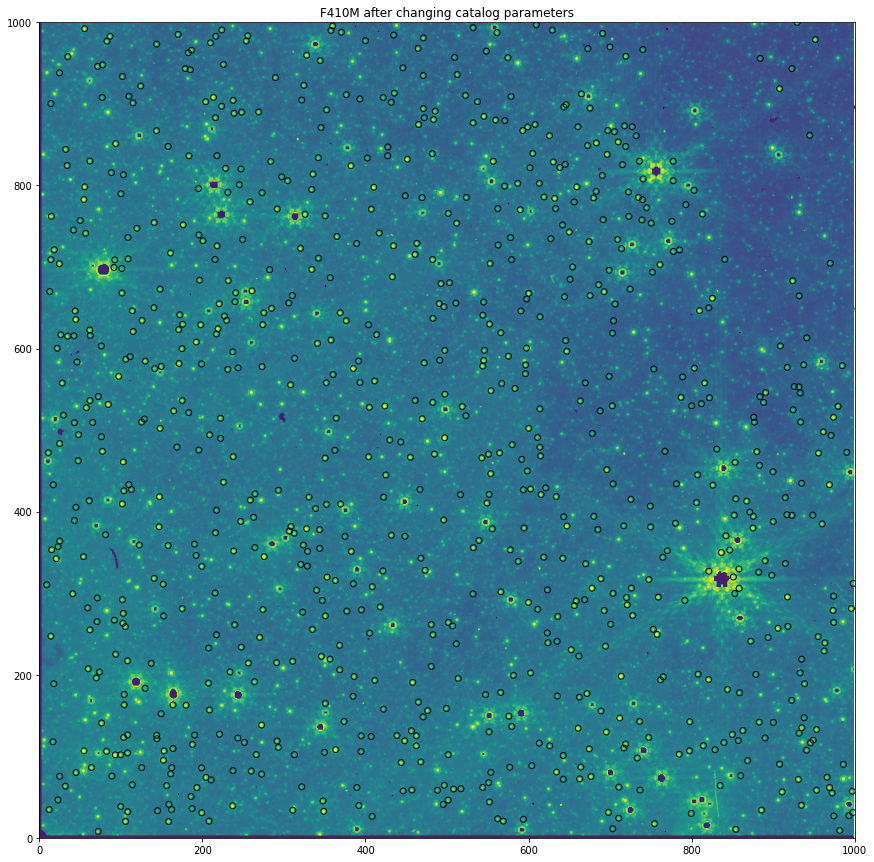

In [24]:
pl.figure(figsize=(15,15))
pl.imshow(np.nan_to_num(im0_410.data)[:1000, :1000], norm=simple_norm(im0_410.data, stretch='log', min_cut=-1, max_cut=1250), origin='lower')
pl.scatter(cat_410['xcentroid'], cat_410['ycentroid'], marker='o', edgecolor='k', facecolor='none')
pl.title("F410M after changing catalog parameters")
pl.axis([0,1000,0,1000]);

# What is the difference between pre-realign and post-realign?

In [25]:
from astropy.io import fits
from astropy import wcs

In [26]:
fh1 = fits.open('F405N/pipeline/jw02221-o001_t001_nircam_clear-f405n-nrca_i2d.fits')
fh2 = fits.open('F405N/pipeline/jw02221-o001_t001_nircam_clear-f405n-nrca_realigned-to-vvv.fits')
fh3 = fits.open('F405N/pipeline/jw02221-o001_t001_nircam_clear-f405n-nrca_realigned-to-refcat.fits')
refcat = Table.read('catalogs/crowdsource_based_nircam-long_reference_astrometric_catalog.ecsv')
refcat2 = Table.read('catalogs/crowdsource_based_nircam-long_reference_astrometric_catalog_truncated10000.ecsv')

In [27]:
refcat[:2]

skycoord_f410m,skycoord_f405n,mag_ab_f410m,RA,DEC
"deg,deg","deg,deg",,deg,deg
SkyCoord,SkyCoord,float32,float64,float64
"266.5138001154151,-28.747930796496217","266.5137997611741,-28.747927048431137",12.388214,266.5138001154151,-28.747930796496217
"266.5582577596566,-28.704823443321967","266.5582430459691,-28.704822293787576",12.531346,266.5582577596566,-28.704823443321967


In [28]:
import warnings
warnings.simplefilter('ignore')

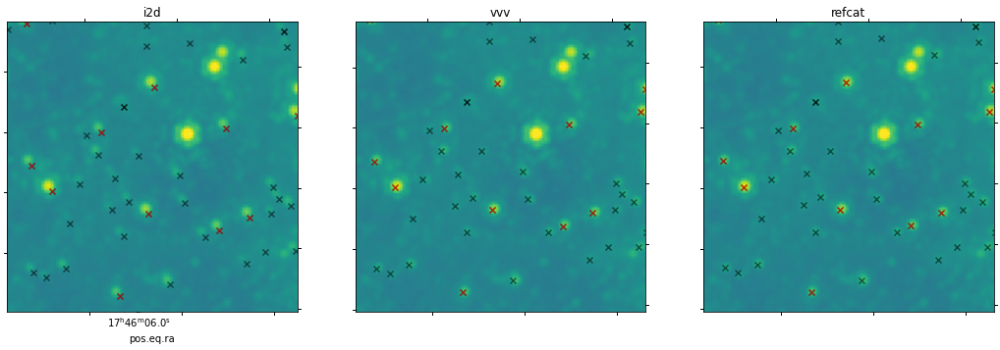

In [29]:
slc = slice(600, 700), slice(600, 700)
fig = pl.figure(figsize=(18,7))
ax1 = pl.subplot(1,3,1, projection=wcs.WCS(fh1['SCI'].header)[slc])
ax2 = pl.subplot(1,3,2, projection=wcs.WCS(fh2['SCI'].header)[slc])
ax3 = pl.subplot(1,3,3, projection=wcs.WCS(fh3['SCI'].header)[slc])
ax1.imshow(fh1['SCI'].data[slc], norm=simple_norm(fh1['SCI'].data, min_cut=-1, max_cut=1250, stretch='log'))
ax2.imshow(fh2['SCI'].data[slc], norm=simple_norm(fh2['SCI'].data, min_cut=-1, max_cut=1250, stretch='log'))
ax3.imshow(fh3['SCI'].data[slc], norm=simple_norm(fh3['SCI'].data, min_cut=-1, max_cut=1250, stretch='log'))
ax1.set_title("i2d"); ax2.set_title("vvv"); ax3.set_title("refcat")
for ax in (ax1, ax2, ax3):
    axlims = ax.axis()
    ax.scatter_coord(refcat['skycoord_f410m'], color='k', marker='x', alpha=0.5)
    ax.scatter_coord(refcat2['skycoord_f410m'], color='r', marker='x', alpha=0.5)
    ax.axis(axlims)

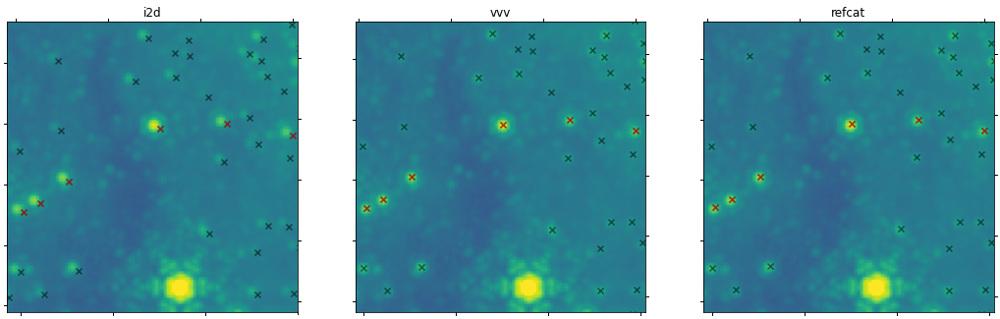

In [30]:
slc = slice(2000, 2100), slice(2000, 2100)
fig = pl.figure(figsize=(18,7))
ax1 = pl.subplot(1,3,1, projection=wcs.WCS(fh1['SCI'].header)[slc])
ax2 = pl.subplot(1,3,2, projection=wcs.WCS(fh2['SCI'].header)[slc])
ax3 = pl.subplot(1,3,3, projection=wcs.WCS(fh3['SCI'].header)[slc])
ax1.imshow(fh1['SCI'].data[slc], norm=simple_norm(fh1['SCI'].data, min_cut=-1, max_cut=1250, stretch='log'))
ax2.imshow(fh2['SCI'].data[slc], norm=simple_norm(fh2['SCI'].data, min_cut=-1, max_cut=1250, stretch='log'))
ax3.imshow(fh3['SCI'].data[slc], norm=simple_norm(fh3['SCI'].data, min_cut=-1, max_cut=1250, stretch='log'))
ax1.set_title("i2d"); ax2.set_title("vvv"); ax3.set_title("refcat")
for ax in (ax1, ax2, ax3):
    axlims = ax.axis()
    ax.scatter_coord(refcat['skycoord_f410m'], color='k', marker='x', alpha=0.5)
    ax.scatter_coord(refcat2['skycoord_f410m'], color='r', marker='x', alpha=0.5)
    ax.axis(axlims)

## Same question but for F410M

Should be identical each time because this _is_ the reference field

In [31]:
fh1 = fits.open('F410M/pipeline/jw02221-o001_t001_nircam_clear-f410m-nrca_i2d.fits')
fh2 = fits.open('F410M/pipeline/jw02221-o001_t001_nircam_clear-f410m-nrca_realigned-to-vvv.fits')
fh3 = fits.open('F410M/pipeline/jw02221-o001_t001_nircam_clear-f410m-nrca_realigned-to-refcat.fits')
refcat = Table.read('catalogs/crowdsource_based_nircam-long_reference_astrometric_catalog.ecsv')
refcat2 = Table.read('catalogs/crowdsource_based_nircam-long_reference_astrometric_catalog_truncated10000.ecsv')

In [32]:
refcat[:2]

skycoord_f410m,skycoord_f405n,mag_ab_f410m,RA,DEC
"deg,deg","deg,deg",,deg,deg
SkyCoord,SkyCoord,float32,float64,float64
"266.5138001154151,-28.747930796496217","266.5137997611741,-28.747927048431137",12.388214,266.5138001154151,-28.747930796496217
"266.5582577596566,-28.704823443321967","266.5582430459691,-28.704822293787576",12.531346,266.5582577596566,-28.704823443321967


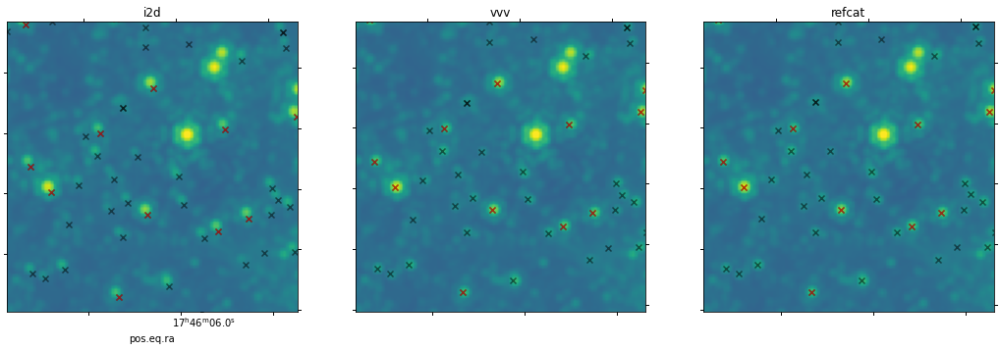

In [33]:
slc = slice(600, 700), slice(600, 700)
fig = pl.figure(figsize=(18,7))
ax1 = pl.subplot(1,3,1, projection=wcs.WCS(fh1['SCI'].header)[slc])
ax2 = pl.subplot(1,3,2, projection=wcs.WCS(fh2['SCI'].header)[slc])
ax3 = pl.subplot(1,3,3, projection=wcs.WCS(fh3['SCI'].header)[slc])
ax1.imshow(fh1['SCI'].data[slc], norm=simple_norm(fh1['SCI'].data, min_cut=-1, max_cut=1250, stretch='log'))
ax2.imshow(fh2['SCI'].data[slc], norm=simple_norm(fh2['SCI'].data, min_cut=-1, max_cut=1250, stretch='log'))
ax3.imshow(fh3['SCI'].data[slc], norm=simple_norm(fh3['SCI'].data, min_cut=-1, max_cut=1250, stretch='log'))
ax1.set_title("i2d"); ax2.set_title("vvv"); ax3.set_title("refcat")
for ax in (ax1, ax2, ax3):
    axlims = ax.axis()
    ax.scatter_coord(refcat['skycoord_f410m'], color='k', marker='x', alpha=0.5)
    ax.scatter_coord(refcat2['skycoord_f410m'], color='r', marker='x', alpha=0.5)
    ax.axis(axlims)

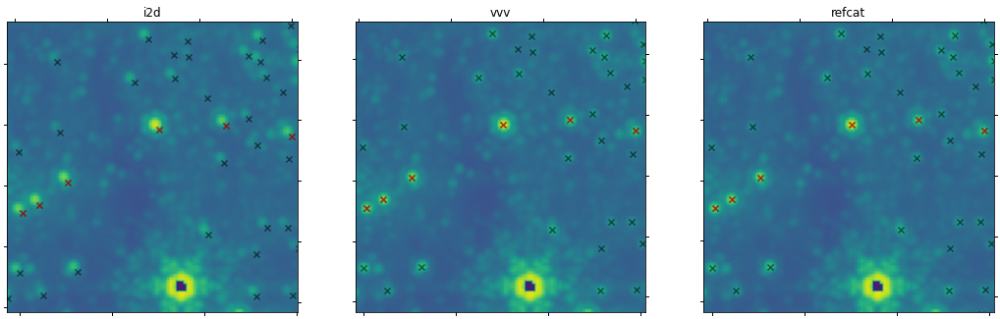

In [34]:
slc = slice(2000, 2100), slice(2000, 2100)
fig = pl.figure(figsize=(18,7))
ax1 = pl.subplot(1,3,1, projection=wcs.WCS(fh1['SCI'].header)[slc])
ax2 = pl.subplot(1,3,2, projection=wcs.WCS(fh2['SCI'].header)[slc])
ax3 = pl.subplot(1,3,3, projection=wcs.WCS(fh3['SCI'].header)[slc])
ax1.imshow(fh1['SCI'].data[slc], norm=simple_norm(fh1['SCI'].data, min_cut=-1, max_cut=1250, stretch='log'))
ax2.imshow(fh2['SCI'].data[slc], norm=simple_norm(fh2['SCI'].data, min_cut=-1, max_cut=1250, stretch='log'))
ax3.imshow(fh3['SCI'].data[slc], norm=simple_norm(fh3['SCI'].data, min_cut=-1, max_cut=1250, stretch='log'))
ax1.set_title("i2d"); ax2.set_title("vvv"); ax3.set_title("refcat")
for ax in (ax1, ax2, ax3):
    axlims = ax.axis()
    ax.scatter_coord(refcat['skycoord_f410m'], color='k', marker='x', alpha=0.5)
    ax.scatter_coord(refcat2['skycoord_f410m'], color='r', marker='x', alpha=0.5)
    ax.axis(axlims)